# GROUP 8

 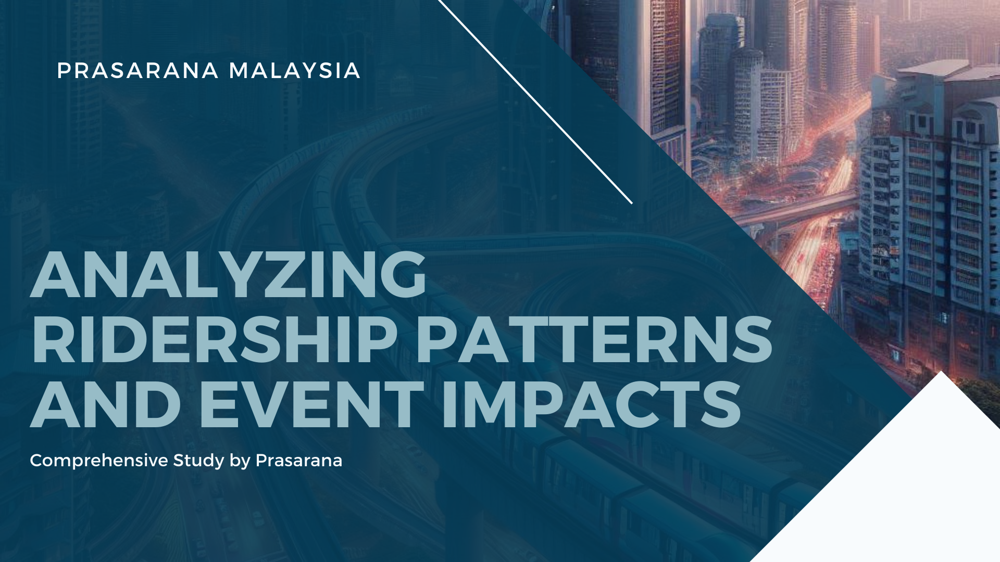

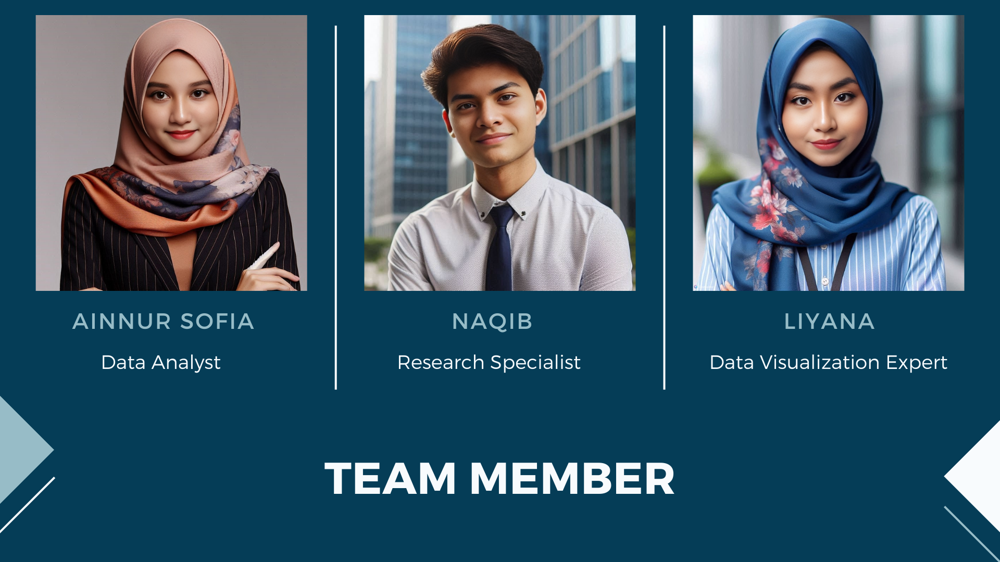

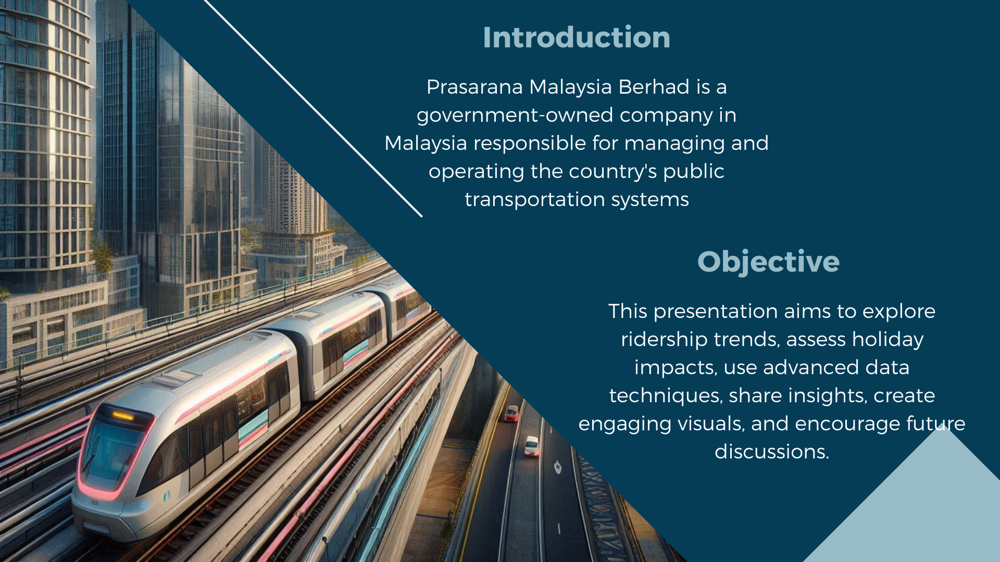

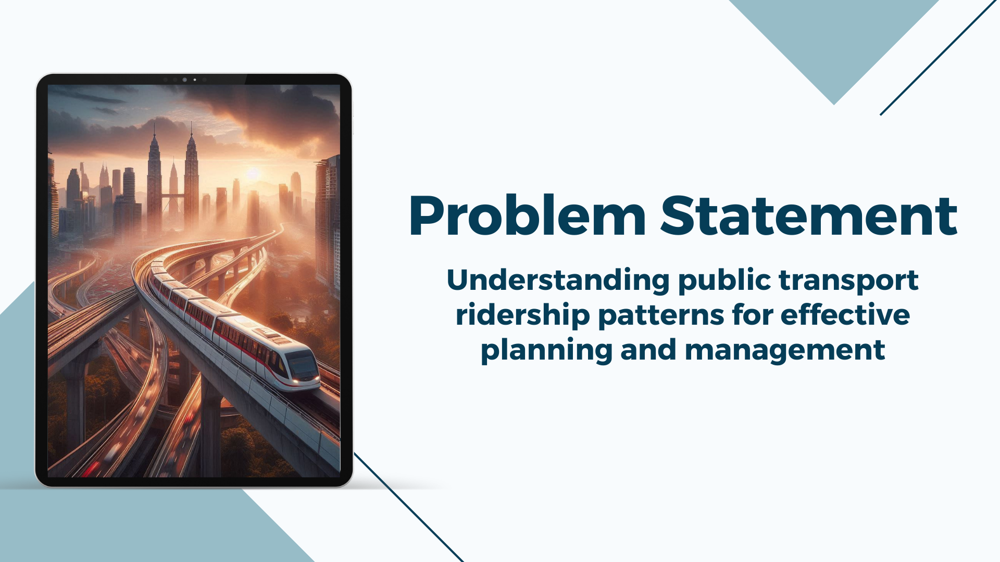

This project aims to analyze the ridership patterns of various rail lines over a specified period. 

#### Objective :
To understand the trends in ridership, identify peak usage periods, and assess the impact of holidays on public transport usage.


#### Data Source:
The data is sourced from the official Malaysian government open data portal [Data.gov.my](https://data.gov.my/data-catalogue/ridership_headline?visual=bus_rpn). The dataset contains daily ridership counts for different rail lines and bus routes. Each entry includes the date and the total ridership for each line.


## Data Preparation
Load the dataset.

In [94]:
import pandas as pd
import matplotlib.pyplot as plt


In [96]:
df = pd.read_csv('ridership_headline.csv')
df

,date,bus_rkl,bus_rkn,bus_rpn,rail_lrt_ampang,rail_mrt_kajang,rail_lrt_kj,rail_monorail,rail_mrt_pjy,rail_ets,rail_intercity,rail_komuter_utara,rail_tebrau,rail_komuter
0,2019-01-01,NaN,NaN,NaN,113357,114173,139634,35804,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-02,NaN,NaN,NaN,182715,169316,274224,31859,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-03,NaN,NaN,NaN,187904,175304,286469,31893,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-04,NaN,NaN,NaN,198420,187891,304755,34121,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-05,NaN,NaN,NaN,120773,112660,145036,29950,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2003,2024-06-26,224543.0,2753.0,44457.0,196416,259838,275959,54934,151871.0,9359.0,2060.0,9493.0,8571.0,36087.0
2004,2024-06-27,223293.0,2794.0,44405.0,194265,255210,270789,54446,149007.0,10640.0,3438.0,11969.0,8883.0,36571.0
2005,2024-06-28,220293.0,2789.0,47644.0,195212,258172,265508,57884,147390.0,11859.0,4660.0,14142.0,9568.0,38347.0
2006,2024-06-29,159861.0,2217.0,43510.0,140938,202785,164337,51657,99383.0,11643.0,4943.0,12891.0,8921.0,27063.0


## Exploratory Data Analysis (EDA) 
#### To understand dataset and prepare the data for further analysis or modeling. 

1. Overview of the Data

2. Data Cleaning(Handling Missing Values)

3. Statistical Summary

4. Data Types and Conversion

5. Visualization

### 1. Overview of the Data:

The basic structure and information about the dataset were obtained.

In [97]:
df.info()  # Display basic information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2008 entries, 0 to 2007
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   date                2008 non-null   object 
 1   bus_rkl             912 non-null    float64
 2   bus_rkn             912 non-null    float64
 3   bus_rpn             912 non-null    float64
 4   rail_lrt_ampang     2008 non-null   int64  
 5   rail_mrt_kajang     2008 non-null   int64  
 6   rail_lrt_kj         2008 non-null   int64  
 7   rail_monorail       2008 non-null   int64  
 8   rail_mrt_pjy        746 non-null    float64
 9   rail_ets            1355 non-null   float64
 10  rail_intercity      1355 non-null   float64
 11  rail_komuter_utara  1355 non-null   float64
 12  rail_tebrau         743 non-null    float64
 13  rail_komuter        274 non-null    float64
dtypes: float64(9), int64(4), object(1)
memory usage: 219.8+ KB


In [98]:
df.head()  # Display the first few rows of the dataset

,date,bus_rkl,bus_rkn,bus_rpn,rail_lrt_ampang,rail_mrt_kajang,rail_lrt_kj,rail_monorail,rail_mrt_pjy,rail_ets,rail_intercity,rail_komuter_utara,rail_tebrau,rail_komuter
0,2019-01-01,NaN,NaN,NaN,113357,114173,139634,35804,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-02,NaN,NaN,NaN,182715,169316,274224,31859,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-03,NaN,NaN,NaN,187904,175304,286469,31893,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-04,NaN,NaN,NaN,198420,187891,304755,34121,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-05,NaN,NaN,NaN,120773,112660,145036,29950,NaN,NaN,NaN,NaN,NaN,NaN


### 2. Data Cleaning:

Check for missing values and handle it appropriately. 

In [99]:
missing_values = df.isnull().sum()
missing_values

date                     0
bus_rkl               1096
bus_rkn               1096
bus_rpn               1096
rail_lrt_ampang          0
rail_mrt_kajang          0
rail_lrt_kj              0
rail_monorail            0
rail_mrt_pjy          1262
rail_ets               653
rail_intercity         653
rail_komuter_utara     653
rail_tebrau           1265
rail_komuter          1734
dtype: int64

In [100]:
df.drop(['bus_rkl', 'bus_rkn', 'bus_rpn', 'rail_ets', 'rail_intercity', 'rail_komuter_utara', 'rail_tebrau', 'rail_komuter'], axis=1, inplace=True)

In [101]:
col = ['rail_mrt_pjy']
df[col] = df[col].fillna(0).astype(int)

df

,date,rail_lrt_ampang,rail_mrt_kajang,rail_lrt_kj,rail_monorail,rail_mrt_pjy
0,2019-01-01,113357,114173,139634,35804,0
1,2019-01-02,182715,169316,274224,31859,0
2,2019-01-03,187904,175304,286469,31893,0
3,2019-01-04,198420,187891,304755,34121,0
4,2019-01-05,120773,112660,145036,29950,0
...,...,...,...,...,...,...
2003,2024-06-26,196416,259838,275959,54934,151871
2004,2024-06-27,194265,255210,270789,54446,149007
2005,2024-06-28,195212,258172,265508,57884,147390
2006,2024-06-29,140938,202785,164337,51657,99383


In [102]:
df.columns= ['Date','LRT Ampang', 'MRT Kajang', 'LRT Kelana Jaya', 'Monorail', 'MRT Putrajaya']
df

,Date,LRT Ampang,MRT Kajang,LRT Kelana Jaya,Monorail,MRT Putrajaya
0,2019-01-01,113357,114173,139634,35804,0
1,2019-01-02,182715,169316,274224,31859,0
2,2019-01-03,187904,175304,286469,31893,0
3,2019-01-04,198420,187891,304755,34121,0
4,2019-01-05,120773,112660,145036,29950,0
...,...,...,...,...,...,...
2003,2024-06-26,196416,259838,275959,54934,151871
2004,2024-06-27,194265,255210,270789,54446,149007
2005,2024-06-28,195212,258172,265508,57884,147390
2006,2024-06-29,140938,202785,164337,51657,99383


#### Dataset below now contains ridership information for various rail lines (LRT Ampang, MRT Kajang, LRT Kelana Jaya, Monorail, MRT Putrajaya) along with the total ridership per day.

In [103]:
df['Total'] = df['LRT Ampang'] +df['MRT Kajang'] +df['LRT Kelana Jaya'] +df['Monorail'] +df['MRT Putrajaya']
df

,Date,LRT Ampang,MRT Kajang,LRT Kelana Jaya,Monorail,MRT Putrajaya,Total
0,2019-01-01,113357,114173,139634,35804,0,402968
1,2019-01-02,182715,169316,274224,31859,0,658114
2,2019-01-03,187904,175304,286469,31893,0,681570
3,2019-01-04,198420,187891,304755,34121,0,725187
4,2019-01-05,120773,112660,145036,29950,0,408419
...,...,...,...,...,...,...,...
2003,2024-06-26,196416,259838,275959,54934,151871,939018
2004,2024-06-27,194265,255210,270789,54446,149007,923717
2005,2024-06-28,195212,258172,265508,57884,147390,924166
2006,2024-06-29,140938,202785,164337,51657,99383,659100


In [104]:
col = ['LRT Ampang', 'MRT Kajang', 'LRT Kelana Jaya', 'Monorail', 'MRT Putrajaya']
total_ridership_by_transport = df[col].sum()
total_ridership_by_transport



LRT Ampang         246376084
MRT Kajang         267967340
LRT Kelana Jaya    333841384
Monorail            62344282
MRT Putrajaya       55815104
dtype: int64

#### Export the latest cleaned data to csv file.


In [105]:
df.to_csv('ridership.csv', index=False) # index=False to avoid saving row index


## 3. Statistical Summary
Provides a basic overview of the dataset, including measures like mean, median, standard deviation, and quartiles.

In [106]:
summary_stats = df.describe()
summary_stats


,LRT Ampang,MRT Kajang,LRT Kelana Jaya,Monorail,MRT Putrajaya,Total
count,2008.000000,2008.000000,2008.000000,2008.000000,2008.000000,2.008000e+03
mean,122697.252988,133449.870518,166255.669323,31047.949203,27796.366534,4.812471e+05
std,55731.343931,68618.424266,91927.399470,16380.316313,46380.267301,2.517580e+05
min,6587.000000,4973.000000,7195.000000,1392.000000,0.000000,2.019000e+04
25%,83375.250000,77312.000000,96596.500000,17084.500000,0.000000,2.760402e+05
50%,121831.500000,130335.000000,146626.500000,32148.000000,0.000000,4.584270e+05
75%,162209.000000,197093.250000,241068.500000,43048.000000,25378.500000,7.312660e+05
max,258313.000000,274188.000000,352328.000000,79585.000000,157813.000000,1.004429e+06


## 4. Data Types 

In [107]:
df.dtypes

Date               object
LRT Ampang          int64
MRT Kajang          int64
LRT Kelana Jaya     int64
Monorail            int64
MRT Putrajaya       int32
Total               int64
dtype: object

## 5. Visualization and Analysis
Visualize the data to identify patterns, trends, and outliers.

#### Histograms for each rail line

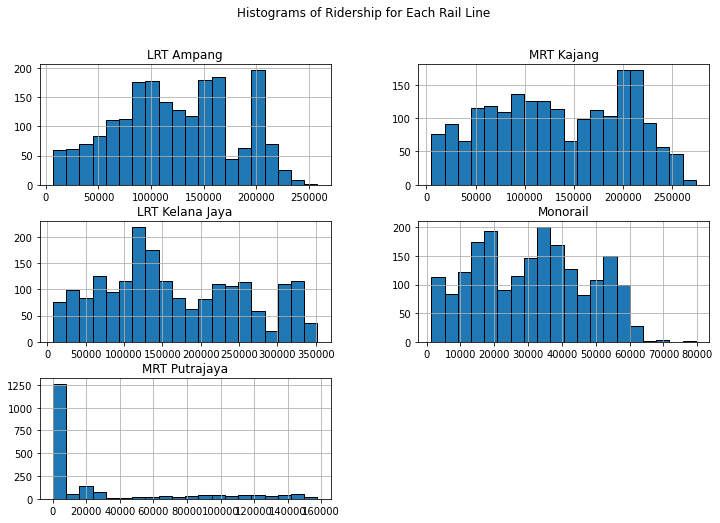

In [111]:
df.drop(columns=['Total']).hist(figsize=(12, 8), bins=20, edgecolor='black')
plt.suptitle('Histograms of Ridership for Each Rail Line')
plt.show()

**Histograms of Ridership for Each Rail Line: These histograms illustrate the distribution of ridership values for each rail line.**

- LRT Ampang shows multiple peaks, indicating varying usage patterns with ridership concentrated around 100,000, 150,000, and 200,000 riders.
- MRT Kajang displays a more uniform distribution with a peak around 200,000 riders, suggesting stable usage.
- LRT Kelana Jaya has a prominent peak around 150,000 riders, indicating a common ridership range.
- Monorail exhibits moderate usage with ridership concentrated around 30,000 to 50,000.
- MRT Putrajaya is heavily skewed towards lower values, reflecting periods of non-operation with the majority of ridership values clustered around 0-50,000.

#### Box plots for each rail line

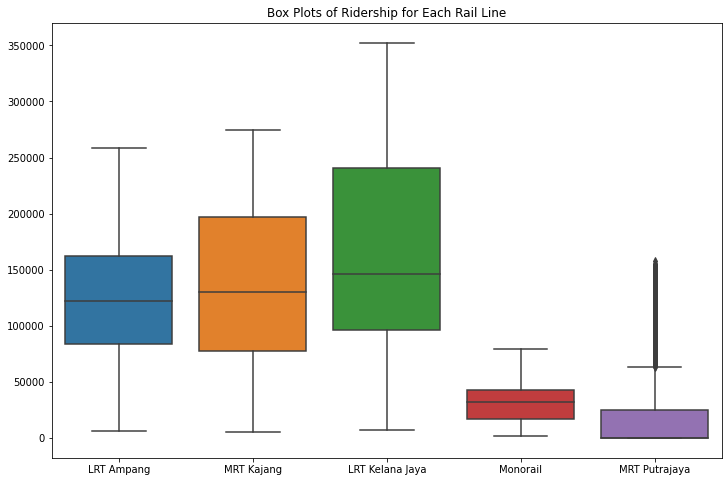

In [112]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df.drop(columns=['Date', 'Total']))
plt.title('Box Plots of Ridership for Each Rail Line')
plt.show()


**Box Plots of Ridership for Each Rail Line**: These box plots show the distribution of ridership for each rail line, highlighting the median, quartiles, and potential outliers.
- **LRT Ampang**: The median ridership is around 125,000, with the interquartile range (IQR) between approximately 100,000 and 150,000.
- **MRT Kajang**: The median ridership is around 150,000, with the IQR between approximately 100,000 and 200,000.
- **LRT Kelana Jaya**: The median ridership is higher at around 175,000, with a wider IQR from approximately 100,000 to 250,000.
- **Monorail**: The ridership is significantly lower, with a median around 30,000 and the IQR between approximately 20,000 and 50,000.
- **MRT Putrajaya**: This line shows a lower median ridership around 20,000, with a narrow IQR due to many periods of non-operation, and notable outliers indicating occasional higher usage.

#### Correlation Analysis
To see correlations between the ridership of different rail lines.

Heatmap to visualize the correlation matrix.

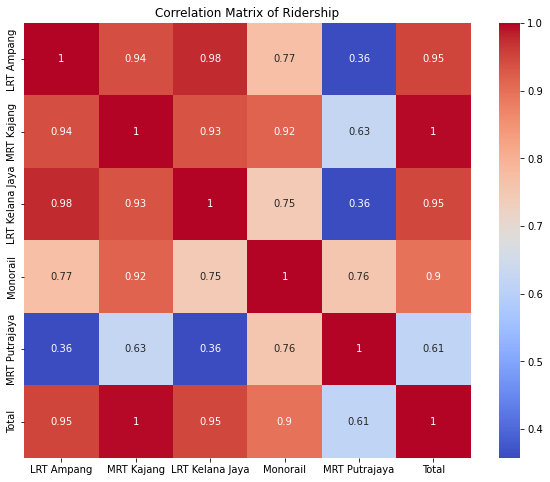

In [113]:
correlation_matrix = df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Ridership')
plt.show()


The values range from -1 to 1, where 1 indicates a perfect positive correlation, -1 indicates a perfect negative correlation, and 0 indicates no correlation.

## Interactive visualizations using Plotly.


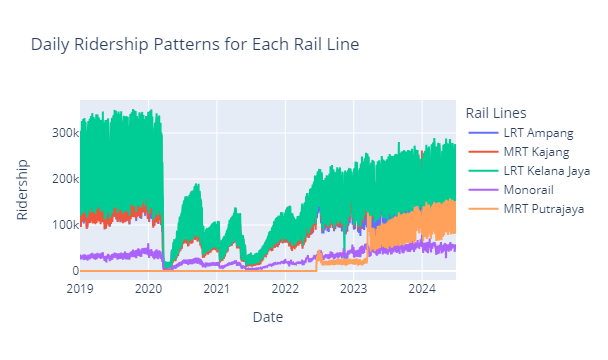

In [114]:
import plotly.express as px
import plotly.graph_objects as go

# Interactive plot for daily ridership patterns for each rail line
fig = go.Figure()

# Add traces for each rail line
fig.add_trace(go.Scatter(x=df['Date'], y=df['LRT Ampang'], mode='lines', name='LRT Ampang'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['MRT Kajang'], mode='lines', name='MRT Kajang'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['LRT Kelana Jaya'], mode='lines', name='LRT Kelana Jaya'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Monorail'], mode='lines', name='Monorail'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['MRT Putrajaya'], mode='lines', name='MRT Putrajaya'))

# Update layout
fig.update_layout(
    title='Daily Ridership Patterns for Each Rail Line',
    xaxis_title='Date',
    yaxis_title='Ridership',
    legend_title='Rail Lines'
)

# Show plot
fig.show()

This line chart shows the daily ridership patterns for each rail line from 2019 to 2024. 
- **LRT Kelana Jaya** (green line) consistently shows the highest ridership, with clear peaks and troughs indicating regular usage patterns.
- **MRT Kajang** (red line) also shows high ridership, second to LRT Kelana Jaya, with similar fluctuation patterns.
- **LRT Ampang** (blue line) demonstrates moderate ridership levels with regular peaks.
- **Monorail** (purple line) has lower ridership, maintaining a more stable but lower trend.
- **MRT Putrajaya** (orange line) starts with zero ridership and gradually increases post its operational commencement, reflecting its growing adoption.


### Highlight peak and lowest ridership points.

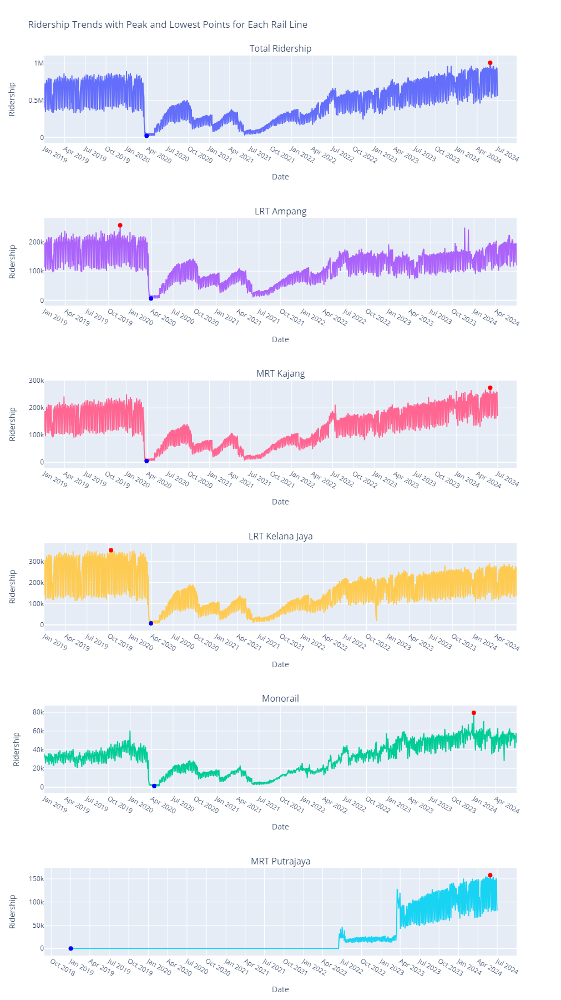

In [53]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Define rail lines
rail_lines = ['LRT Ampang', 'MRT Kajang', 'LRT Kelana Jaya', 'Monorail', 'MRT Putrajaya']

# Create subplots
fig = make_subplots(rows=6, cols=1, subplot_titles=['Total Ridership'] + rail_lines)

# Add the total ridership plot and highlight peak and lowest points
total_max_ridership = df['Total'].max()
total_max_ridership_date = df[df['Total'] == total_max_ridership]['Date'].iloc[0]
total_min_ridership = df['Total'].min()
total_min_ridership_date = df[df['Total'] == total_min_ridership]['Date'].iloc[0]

fig.add_trace(go.Scatter(
    x=df['Date'], y=df['Total'], mode='lines', name='Total Ridership',
    hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Total Ridership:</b> %{y:.2f}'
), row=1, col=1)

fig.add_trace(go.Scatter(
    x=[total_max_ridership_date], y=[total_max_ridership], mode='markers',
    marker=dict(color='red', size=8),
    name='Total Ridership Peak',
    hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Total Ridership Peak:</b> %{y:.2f}'
), row=1, col=1)

fig.add_trace(go.Scatter(
    x=[total_min_ridership_date], y=[total_min_ridership], mode='markers',
    marker=dict(color='blue', size=8),
    name='Total Ridership Lowest',
    hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Total Ridership Lowest:</b> %{y:.2f}'
), row=1, col=1)

# Add traces and highlight peak and lowest ridership periods for each rail line
for i, rail_line in enumerate(rail_lines, start=2):
    # Find the maximum and minimum ridership points
    max_ridership = df[rail_line].max()
    max_ridership_date = df[df[rail_line] == max_ridership]['Date'].iloc[0]
    min_ridership = df[rail_line].min()
    min_ridership_date = df[df[rail_line] == min_ridership]['Date'].iloc[0]
    
    fig.add_trace(go.Scatter(
        x=df['Date'], y=df[rail_line], mode='lines', name=rail_line,
        hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Ridership:</b> %{y:.2f}'
    ), row=i, col=1)
    
    # Add red point to mark the highest point
    fig.add_trace(go.Scatter(
        x=[max_ridership_date], y=[max_ridership], mode='markers',
        marker=dict(color='red', size=8),
        name=f'{rail_line} Peak',
        hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Ridership Peak:</b> %{y:.2f}'
    ), row=i, col=1)
    
    # Add blue point to mark the lowest point
    fig.add_trace(go.Scatter(
        x=[min_ridership_date], y=[min_ridership], mode='markers',
        marker=dict(color='blue', size=8),
        name=f'{rail_line} Lowest',
        hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Ridership Lowest:</b> %{y:.2f}'
    ), row=i, col=1)

# Update layout
fig.update_layout(height=1800, width=1100, title_text="Ridership Trends with Peak and Lowest Points for Each Rail Line", showlegend=False)
fig.update_xaxes(title_text="Date", tickformat="%b %Y", dtick="M3")
fig.update_yaxes(title_text="Ridership")

# Show the figure
fig.show()


This graph shows the total ridership over time, highlighting a peak on **29 May 2024**, with 1,004,429 passengers. This spike correlates with the Kuala Lumpur International Book Fair (PBAKL) and the school holiday period, shows the significant impact of special events and holidays on ridership patterns.

The lowest ridership point on **29 March 2020**, occurring during the **COVID-19 lockdown**, shows the drastic reduction in public transport usage due to the pandemic.


### Literature Review: 

**Impact of COVID-19 on Public Transport:**

Gkiotsalitis, K., & Cats, O. (2021). "Public transportation planning adaption under the COVID-19 pandemic crisis: Literature review of research needs and directions." Transport Reviews, 41(3), 374-392.

This paper reviews the impact of COVID-19 on public transport usage globally and discusses the immediate reduction in ridership due to lockdowns and travel restrictions.

**Event and Festival Impacts on Public Transport:**

Musso, A., et al. (2019). "Impact of large events on urban public transport: The case of the 2015 Expo in Milan." Transportation Research Procedia, 41, 994-1002.

This study explores how large events like the Milan Expo significantly increased public transport ridership, drawing parallels to events like PBAKL.

### COVID-19 Impact

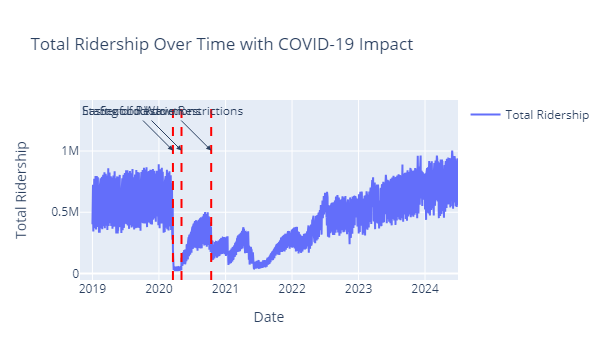

In [117]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Define key COVID-19 dates
covid_events = {
    "Start of Lockdown": "2020-03-18",
    "Easing of Restrictions": "2020-05-04",
    "Second Wave Restrictions": "2020-10-14"S
}

# Create the plot
fig = make_subplots(rows=1, cols=1)

# Add total ridership line
fig.add_trace(go.Scatter(
    x=df['Date'], y=df['Total'], mode='lines', name='Total Ridership',
    hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Total Ridership:</b> %{y:.2f}'
))

# Annotate COVID-19 dates
for event, date in covid_events.items():
    fig.add_vline(x=pd.to_datetime(date), line=dict(color='red', width=2, dash='dash'))
    fig.add_annotation(x=pd.to_datetime(date), y=max(df['Total']), text=event, showarrow=True, arrowhead=2, ax=-40, ay=-40)

# Update layout
fig.update_layout(title='Total Ridership Over Time with COVID-19 Impact',
                  xaxis_title='Date', yaxis_title='Total Ridership',
                  showlegend=True)

fig.show()



**Total Ridership Over Time with COVID-19 Impact**: This graph illustrates the significant drops in ridership during key COVID-19 events. The start of the lockdown on March 18, 2020, caused an immediate decline. As restrictions eased on May 4, 2020, ridership gradually increased but remained below pre-lockdown levels. The second wave of restrictions on October 14, 2020, led to another drop in ridership, highlighting the ongoing impact of the pandemic on public transport usage.

### Holiday Impact

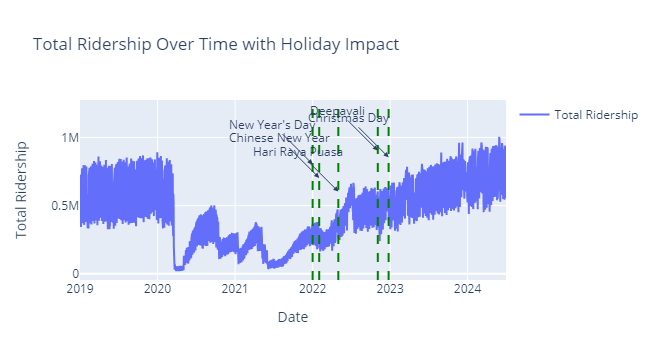

In [119]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Define key holidays
holidays = {
    "New Year's Day": "2022-01-01",
    "Chinese New Year": "2022-02-01",
    "Hari Raya Puasa": "2022-05-02",
    "Deepavali": "2022-11-04",
    "Christmas Day": "2022-12-25"
}

# Create the plot
fig = make_subplots(rows=1, cols=1)

# Add total ridership line
fig.add_trace(go.Scatter(
    x=df['Date'], y=df['Total'], mode='lines', name='Total Ridership',
    hovertemplate='<b>Date:</b> %{x|%d %b %Y}<br><b>Total Ridership:</b> %{y:.2f}'
))

# Annotate holiday dates with adjusted positions to avoid overlap
y_positions = [0.8, 0.7, 0.6, 0.9, 0.85]  # Adjust y positions for clarity
for i, (holiday, date) in enumerate(holidays.items()):
    fig.add_vline(x=pd.to_datetime(date), line=dict(color='green', width=2, dash='dash'))
    fig.add_annotation(
        x=pd.to_datetime(date), 
        y=y_positions[i] * max(df['Total']), 
        text=holiday, 
        showarrow=True, 
        arrowhead=2, 
        ax=-40, 
        ay=-40
    )

# Update layout
fig.update_layout(
    title='Total Ridership Over Time with Holiday Impact',
    xaxis_title='Date', 
    yaxis_title='Total Ridership',
    showlegend=True
)

fig.show()


**Total Ridership Over Time with Holiday Impact:** This graph highlights how major holidays affect ridership patterns. Notable holidays such as New Year's Day, Chinese New Year, Hari Raya Puasa, Deepavali, and Christmas Day are marked with green dashed lines. Each holiday shows a distinct change in ridership, reflecting increased travel and variations in commuter behavior during these periods

### Popular Days to Travel

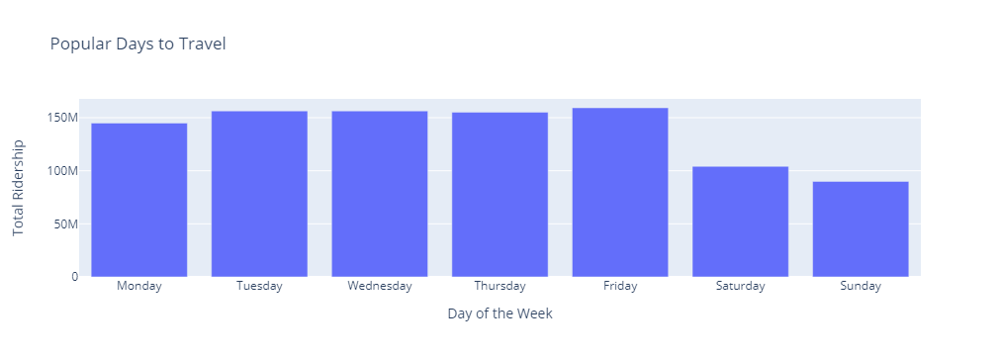

In [54]:
# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Extract the day of the week
df['DayOfWeek'] = df['Date'].dt.day_name()

# Aggregate the ridership data by day of the week
weekly_ridership = df.groupby('DayOfWeek')['Total'].sum().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Create a Plotly bar chart
fig = px.bar(weekly_ridership, x=weekly_ridership.index, y=weekly_ridership.values,
             labels={'x': 'Day of the Week', 'y': 'Total Ridership'},
             title='Popular Days to Travel')

# Update layout for better readability
fig.update_layout(xaxis_title='Day of the Week', yaxis_title='Total Ridership', title='Popular Days to Travel')
fig.show()


This graph illustrates the **total ridership for each day of the week**, showing that weekdays (Monday to Friday) consistently have higher ridership compared to weekends (Saturday and Sunday). This pattern reflects the high demand for public transport for commuting to work and school during weekdays, with a noticeable drop on weekends, typically associated with leisure travel.

### Ridership Popular Days to Travel by each Trail Line

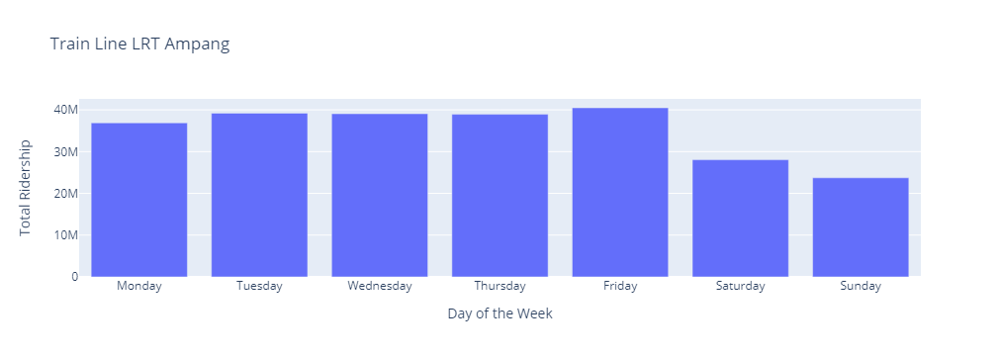

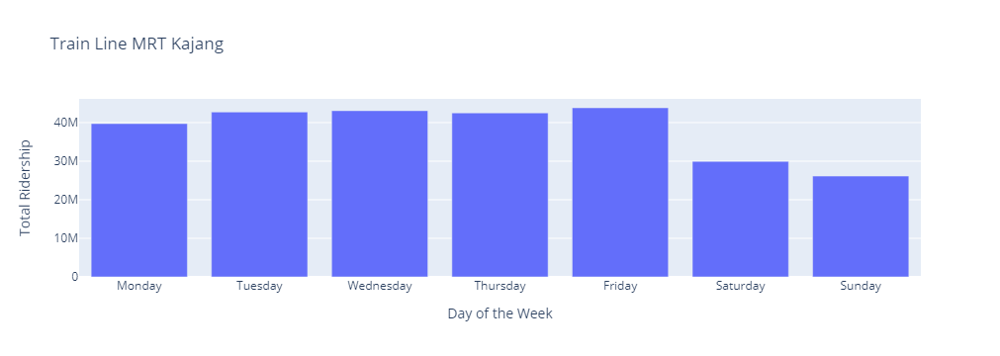

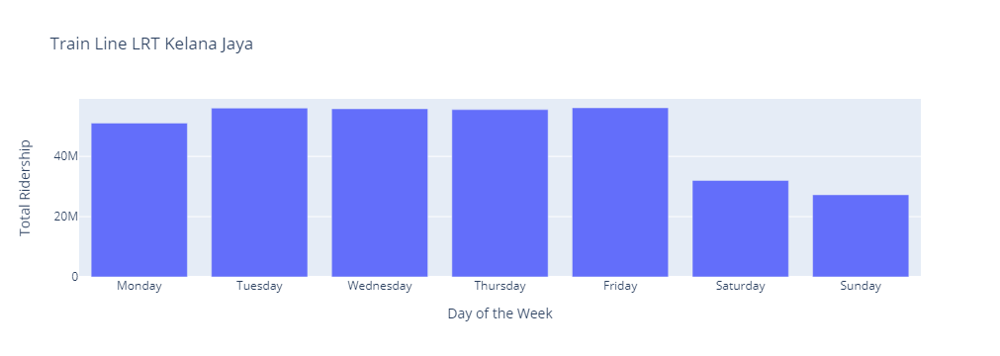

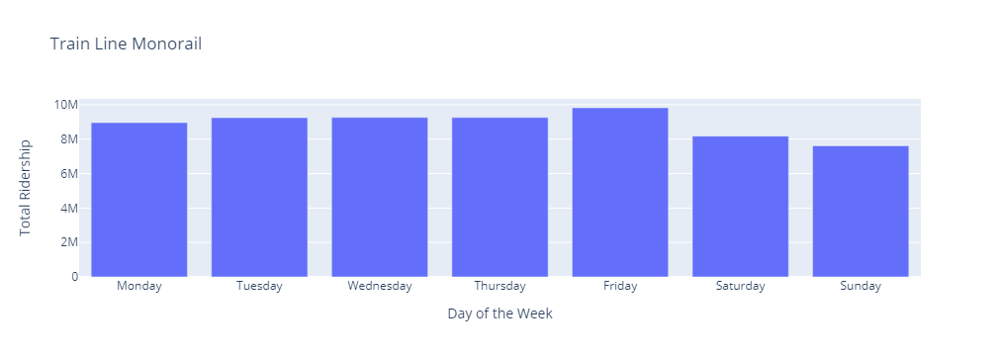

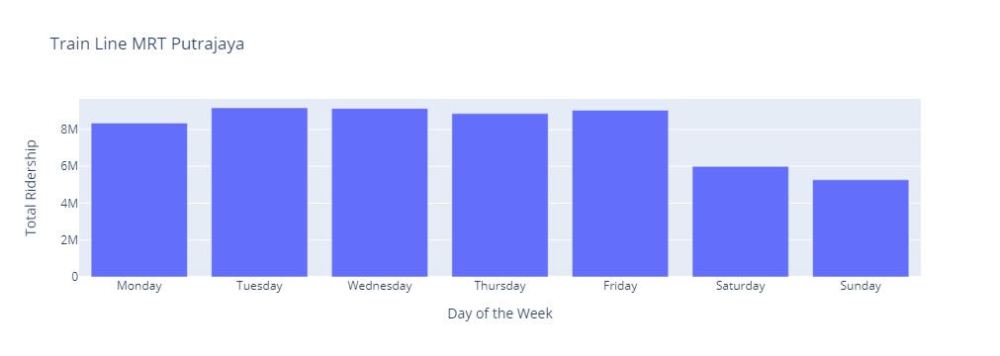

In [55]:
import pandas as pd
import plotly.express as px

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Extract the day of the week
df['DayOfWeek'] = df['Date'].dt.day_name()

# List of train and bus lines
train_lines = ['LRT Ampang', 'MRT Kajang', 'LRT Kelana Jaya', 'Monorail', 'MRT Putrajaya']  # Replace with actual train line columns


# Function to create Plotly bar chart for a given list of lines
def create_bar_charts(lines, title_prefix):
    for line in lines:
        weekly_ridership = df.groupby('DayOfWeek')[line].sum().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
        fig = px.bar(weekly_ridership, x=weekly_ridership.index, y=weekly_ridership.values,
                     labels={'x': 'Day of the Week', 'y': 'Total Ridership'},
                     title=f'{title_prefix} {line}')
        fig.update_layout(xaxis_title='Day of the Week', yaxis_title='Total Ridership', title=f'{title_prefix} {line}')
        fig.show()

# Create bar charts for train lines
create_bar_charts(train_lines, 'Train Line')




### Weekend vs. Weekday Ridership

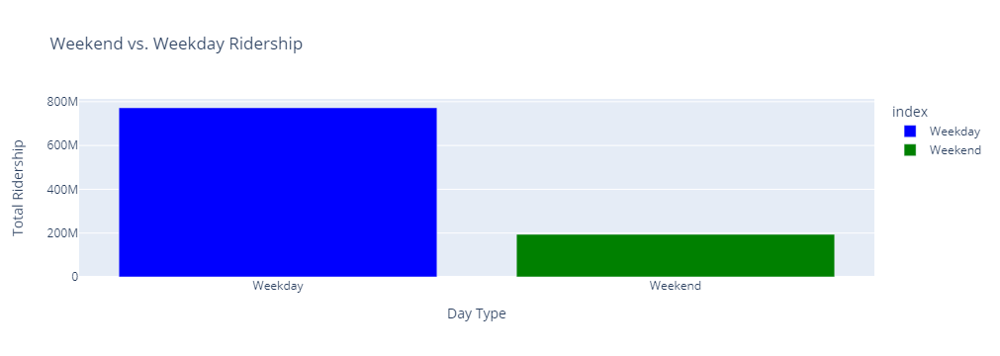

In [56]:
import pandas as pd
import plotly.express as px

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Extract the day of the week
df['DayOfWeek'] = df['Date'].dt.day_name()

# Aggregate the ridership data by weekend and weekdays
df['Weekend'] = df['DayOfWeek'].isin(['Saturday', 'Sunday'])

# Aggregate the ridership data by weekend and weekday
weekend_ridership = df.groupby('Weekend')['Total'].sum()
weekend_ridership.index = ['Weekday', 'Weekend']

# Create a Plotly bar chart
fig = px.bar(weekend_ridership, x=weekend_ridership.index, y=weekend_ridership.values,
             labels={'x': 'Day Type', 'y': 'Total Ridership'},
             title='Weekend vs. Weekday Ridership',
             color=weekend_ridership.index,
             color_discrete_map={'Weekday': 'blue', 'Weekend': 'green'})

fig.update_layout(xaxis_title='Day Type', yaxis_title='Total Ridership', title='Weekend vs. Weekday Ridership')
fig.show()


This graph compares total ridership on weekdays versus weekends. It shows that **weekday ridership is significantly higher than weekend ridership**, reflecting the heavy use of public transport for **commuting to work and school**. The lower ridership on weekends indicates less demand, typically associated with **leisure travel**.

#### Literature Review

**Temporal Patterns of Public Transport Usage in Malaysia:**

Yazid, M. R. M., Ismail, R., & Atiq, R. O. A. R. (2011). "The Use of Public Transport: A Case Study of Kuala Lumpur." Procedia Engineering, 20, 41-49.

*This research highlights the temporal patterns in public transport usage in Kuala Lumpur, showing distinct peaks on weekdays correlating with work and school schedules.*

### Monthly Ridership Patterns

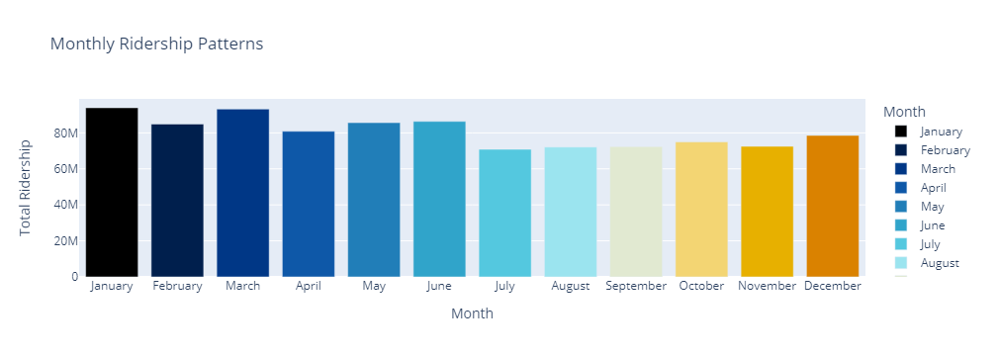

In [57]:
import pandas as pd
import plotly.express as px

# Extract the month from the 'Date' column
df['Month'] = df['Date'].dt.month_name()

# Aggregate the ridership data by month
monthly_ridership = df.groupby('Month')['Total'].sum().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])

# Create a Plotly bar chart
fig = px.bar(monthly_ridership, x=monthly_ridership.index, y=monthly_ridership.values,
             labels={'x': 'Month', 'y': 'Total Ridership'},
             title='Monthly Ridership Patterns',
             color=monthly_ridership.index,
             color_discrete_sequence=px.colors.cyclical.IceFire)

fig.update_layout(xaxis_title='Month', yaxis_title='Total Ridership', title='Monthly Ridership Patterns')
fig.show()



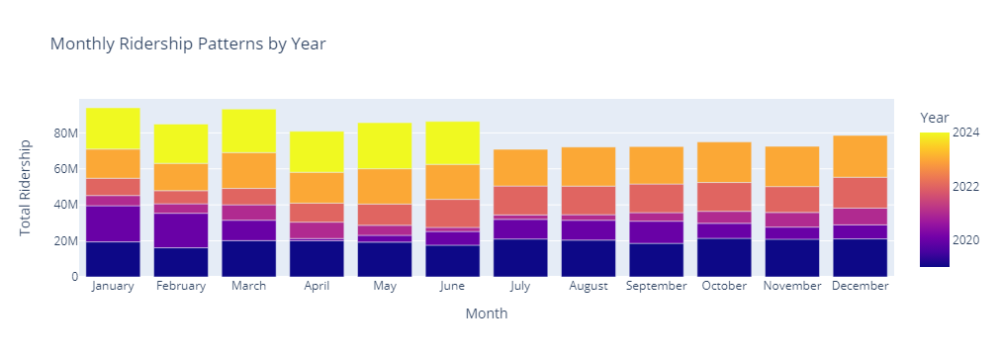

In [58]:
import pandas as pd
import plotly.express as px

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Extract the year and month from the 'Date' column
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month_name()

# Aggregate the ridership data by month and year
monthly_ridership = df.groupby(['Year', 'Month'])['Total'].sum().unstack()

# Ensure months are in the correct order
monthly_ridership = monthly_ridership.reindex(columns=[
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])

# Melt the DataFrame for easier plotting
monthly_ridership_melted = monthly_ridership.reset_index().melt(id_vars='Year', var_name='Month', value_name='Total Ridership')

# Create a Plotly bar chart
fig = px.bar(monthly_ridership_melted, x='Month', y='Total Ridership', color='Year',
             labels={'Month': 'Month', 'Total Ridership': 'Total Ridership'},
             title='Monthly Ridership Patterns by Year',
             barmode='group')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Ridership', title='Monthly Ridership Patterns by Year')
fig.show()


## Prediction using Random Forest Regression

Random Forest Regression is a powerful machine learning technique that creates multiple decision trees during training and outputs the mean prediction of the individual trees. This approach helps to improve the model's accuracy and reduce overfitting.

In [93]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

# Prepare the data
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Year'] = df['Date'].dt.year
features = ['DayOfYear', 'Year']
target = 'Total'


### Split the data into training and test sets

The data is split into training sets (80%) and testing sets (20%) used for testing its performance.

In [ ]:
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Fit the Random Forest model and make prediction on test data

In [60]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

predictions = model.predict(X_test)

### Mean Squared Error (MSE): 
Measures the average squared difference between the actual and predicted values. A lower MSE indicates a better model performance.

In [61]:
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 14360572632.651394


### Plot the actual and predicted values


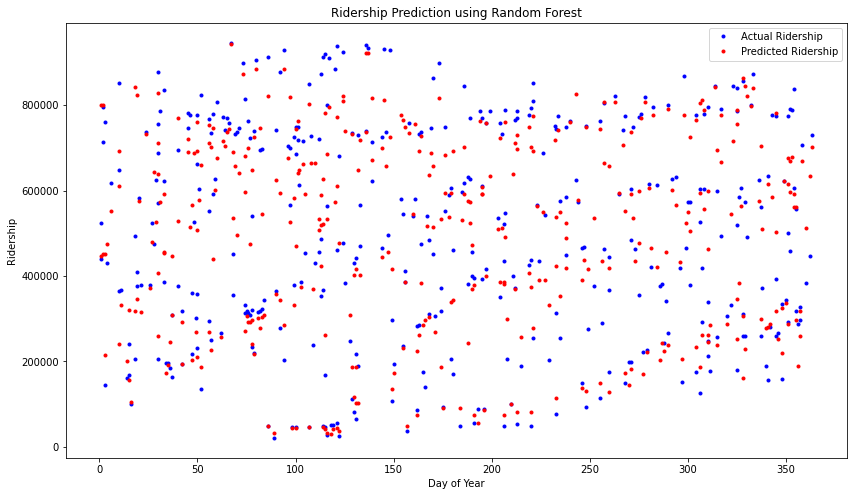

In [63]:
plt.figure(figsize=(14, 8))
plt.plot(X_test['DayOfYear'], y_test, 'b.', label='Actual Ridership')
plt.plot(X_test['DayOfYear'], predictions, 'r.', label='Predicted Ridership')
plt.xlabel('Day of Year')
plt.ylabel('Ridership')
plt.title('Ridership Prediction using Random Forest')
plt.legend()
plt.show()

#### Result from the Plot: Ridership Prediction using Random Forest

- The actual and predicted values generally follow similar patterns. 
- MSE = 14.360 billions indicating significant discrepancies between actual and predicted values.
- High MSE suggests that the model's accuracy is affected by some underlying issues, like the presence of many zero values in the dataset (high number of zero values in the MRT Putrajaya line)

#### Address the issue of zero values
- 'Operational' feature was added, helps the model differentiate between actual ridership data and periods of non-operation.
- Refit the Model to improve its predictive accuracy.


### Modify Datasets to Handle Zero Values

Mean Squared Error: 174603224.6678945


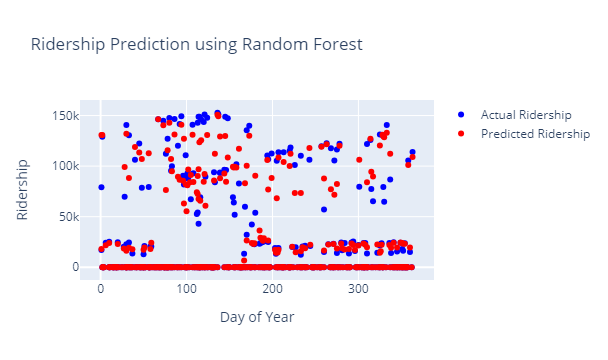

In [92]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Convert 'Date' column to datetime format if not already
df['Date'] = pd.to_datetime(df['Date'])

# Add a feature indicating whether the rail line was operational
operation_start_date = pd.to_datetime('2022-01-01')
df['Operational'] = (df['Date'] >= operation_start_date).astype(int)

# Prepare the data
df['DayOfYear'] = df['Date'].dt.dayofyear
df['Year'] = df['Date'].dt.year
features = ['DayOfYear', 'Year', 'Operational']
target = 'MRT Putrajaya'

# Split the data into training and test sets
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

# Calculate the error
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

# Plot the actual and predicted values
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(
    x=X_test['DayOfYear'], y=y_test, mode='markers', name='Actual Ridership',
    marker=dict(color='blue'),
    hovertemplate='<b>Day of Year:</b> %{x}<br><b>Actual Ridership:</b> %{y:.2f}'
))

fig.add_trace(go.Scatter(
    x=X_test['DayOfYear'], y=predictions, mode='markers', name='Predicted Ridership',
    marker=dict(color='red'),
    hovertemplate='<b>Day of Year:</b> %{x}<br><b>Predicted Ridership:</b> %{y:.2f}'
))

fig.update_layout(title='Ridership Prediction using Random Forest',
                  xaxis_title='Day of Year', yaxis_title='Ridership',
                  showlegend=True)

fig.show()


### Results After Adjustment:
- Mean Squared Error significantly reduced to 174.603 millions.
- Significant improvement in model's accuracy, as it can now better predict ridership patterns by focusing on relevant data.


## Solution to problem

Our project focuses on analyzing ridership data to uncover patterns and trends that can help Prasarana improve service delivery. By using advanced data analysis techniques, we aim to:

- **Optimize Train Frequencies:** Adjust train schedules to better meet demand during peak hours, special events, and holidays.
- **Enhance Passenger Experience:** Ensure that facilities and services are in place to handle high passenger volumes efficiently.
- **Inform Strategic Decisions:** Provide data-driven insights that guide our long-term planning and resource allocation.